<a href="https://colab.research.google.com/github/mdhasanali3/yolov5-webcam/blob/main/product_detector_16batch_110epoch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



### clonning git repo & install requirements
please change runtime type to GPU ,do manually


In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
from yolov5 import utils
from IPython.display import Image, clear_output  # to display images
display = utils.notebook_init()  # checks

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.0/78.2 GB disk)
Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


## adding dataset from roboflow
roboflow help to annotate data
https://app.roboflow.com/


In [2]:
%cd /content/yolov5
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="nnZX1JTzHvqMJrXkIlKY")
project = rf.workspace().project("product-gnlf3")
dataset = project.version(1).download("yolov5")

/content/yolov5
     |████████████████████████████████| 145 kB 12.4 MB/s 
     |████████████████████████████████| 178 kB 49.3 MB/s 
     |████████████████████████████████| 1.1 MB 46.0 MB/s 
     |████████████████████████████████| 67 kB 5.4 MB/s 
     |████████████████████████████████| 138 kB 52.3 MB/s 
     |████████████████████████████████| 62 kB 863 kB/s 
  Created wheel for roboflow: filename=roboflow-0.2.1-py3-none-any.whl size=20914 sha256=283b396a671bc7e5f0947c2b90075058cc43165fc3f2a30f2583393924695e9e
  Stored in directory: /root/.cache/pip/wheels/57/00/03/2d83f3e90ff41c36eef9c3747c328290c01b06e2619f9ed7b6
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=fc4f8db925da2e466dd0c12883a79b52e615d082ac0e589e21f178a9bd7b4ef7
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built roboflow wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to product-1 in yolov5pytorch:: 100%|██████████| 1710/1710 [00:01<00:00, 1122.25it/s]


### check your data classes

In [3]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- pa1
- pa2
- pa3
nc: 3
train: product-1/train/images
val: product-1/valid/images


### weight and bias 
wandb integreted with yolov5 for realtime better visulization and cloud login of train runs also they have feature to colaborate with team. This allows better understanding , comparison and introspection, as well improved visibility and collaboration for teams. 
https://wandb.ai/

In [ ]:
# Weights & Biases  (optional)
%pip install -q wandb
import wandb
wandb.login()

     |████████████████████████████████| 1.7 MB 3.8 MB/s 
     |████████████████████████████████| 180 kB 47.6 MB/s 
     |████████████████████████████████| 97 kB 5.8 MB/s 
     |████████████████████████████████| 140 kB 43.1 MB/s 
     |████████████████████████████████| 63 kB 1.5 MB/s 


<IPython.core.display.Javascript object>

wandb: You can find your API key in your browser here: https://wandb.ai/authorize


wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

## train phase

In [4]:
!python train.py --img 416 --batch 16 --epochs 110 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/product-1/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=110, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, tran

## tensorboard for visulising different measure and runs and comparision

In [5]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## plotting result saved from train data

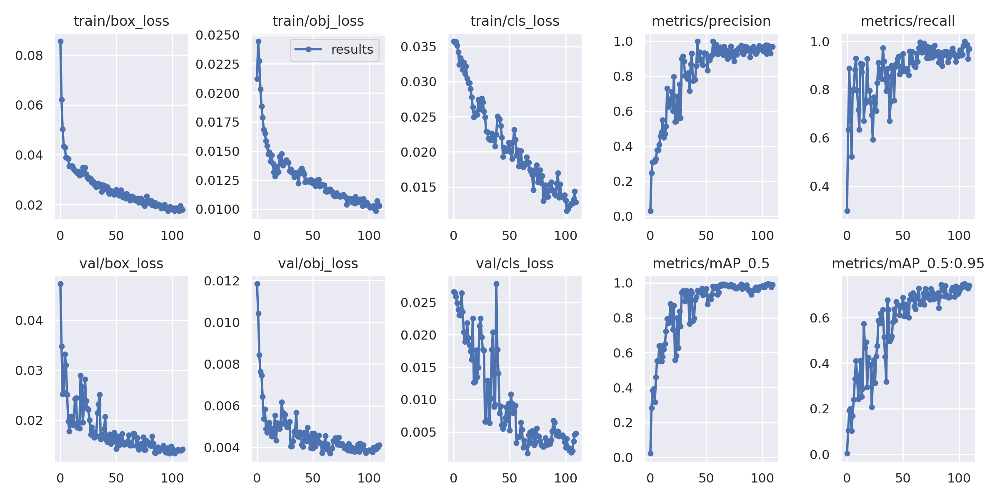

In [6]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/exp/results.png', width=1000)  # view results.png

## test on best

In [7]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/product-1/test/images, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/34 /content/yolov5/product-1/test/images/pro_a1-016_jpg.rf.68a6e1ff38b4dc3804d124d6cbb0f4ce.jpg: 416x416 2 pa1s, Done. (0.028s)
image 2/34 /content/yolov5/product-1/test/images/pro_a1-032_jpg.rf.d688ef3b23ec7ed18d18a08a994d93a6.jpg: 416x416 1 pa1, Done. (0.029s)
image 3/34 /content/yolov5/product-1/test/images/pro_a1-047_jpg.rf.1400fb60b9eb6272e7bdeb8e062f5d88.jpg: 416x

## export model and weight for tfjs browser use

In [8]:
!python export.py --weights runs/train/exp/weights/best.pt --include tfjs

export: data=data/coco128.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, train=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tfjs']
YOLOv5 🚀 v6.0-159-gdb6ec66 torch 1.10.0+cu111 CPU

Fusing layers... 
Model Summary: 213 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt (14.3 MB)

TensorFlow saved_model: starting export with tensorflow 2.7.0...

                 from  n    params  module                                  arguments                     
2021-12-27 09:09:40.251921: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
  0                -1  1      3520  models.common.Conv                      [3, 32, 6,

## plot test image with bbox and labels and accuracy

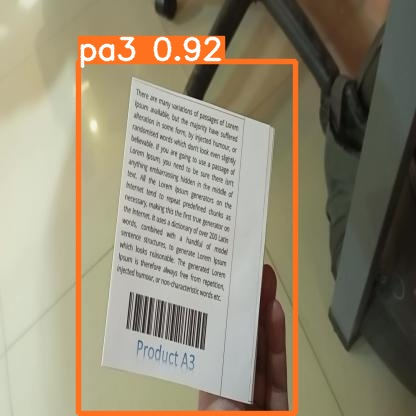

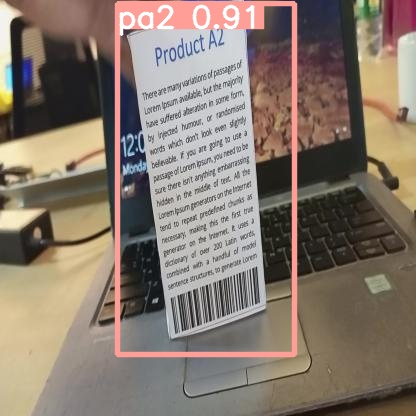

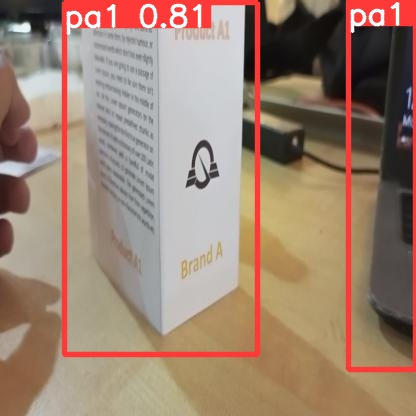

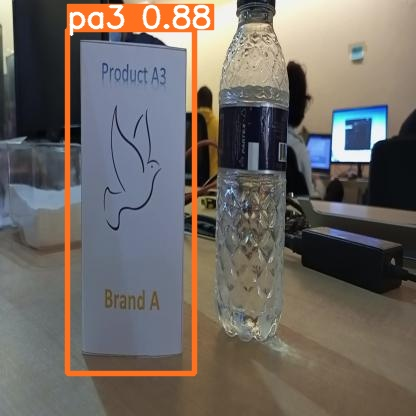

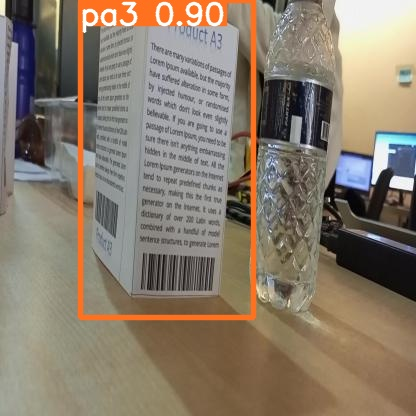

...

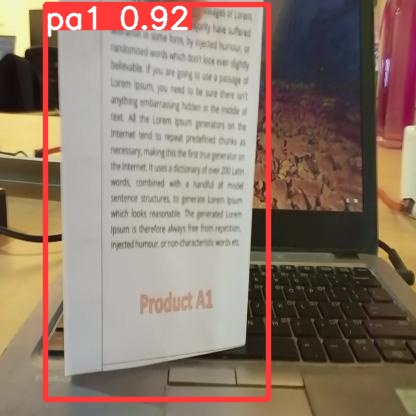

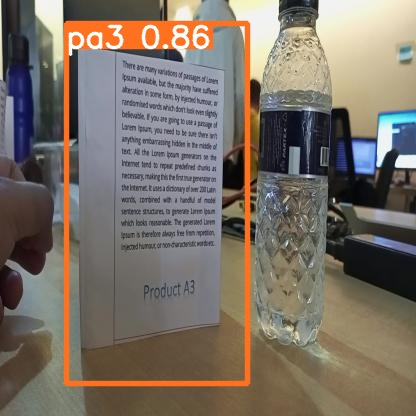

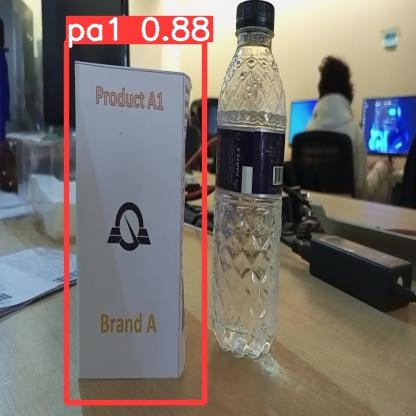

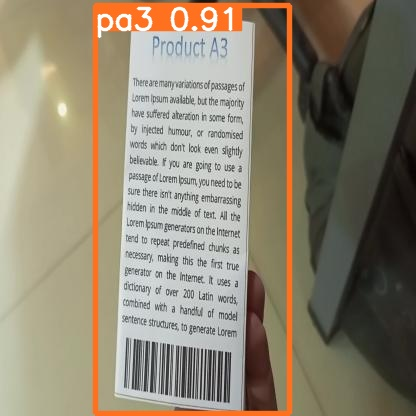

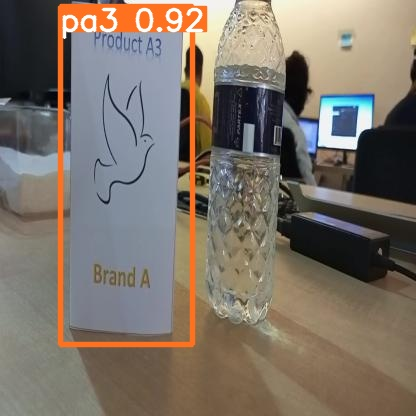

In [9]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## mount drive 

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

In [10]:
!zip -r /content/yolov5/runs/train/exp/weights.zip /content/yolov5


  adding: content/yolov5/ (stored 0%)
  adding: content/yolov5/utils/ (stored 0%)
  adding: content/yolov5/utils/datasets.py (deflated 71%)
  adding: content/yolov5/utils/__pycache__/ (stored 0%)
  adding: content/yolov5/utils/__pycache__/autoanchor.cpython-37.pyc (deflated 43%)
  adding: content/yolov5/utils/__pycache__/loss.cpython-37.pyc (deflated 47%)
  adding: content/yolov5/utils/__pycache__/general.cpython-37.pyc (deflated 50%)
  adding: content/yolov5/utils/__pycache__/activations.cpython-37.pyc (deflated 58%)
  adding: content/yolov5/utils/__pycache__/autobatch.cpython-37.pyc (deflated 36%)
  adding: content/yolov5/utils/__pycache__/__init__.cpython-37.pyc (deflated 28%)
  adding: content/yolov5/utils/__pycache__/downloads.cpython-37.pyc (deflated 41%)
  adding: content/yolov5/utils/__pycache__/callbacks.cpython-37.pyc (deflated 55%)
  adding: content/yolov5/utils/__pycache__/metrics.cpython-37.pyc (deflated 48%)
  adding: content/yolov5/utils/__pycache__/plots.cpython-37.pyc 